In [ ]:
import os
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision
from tqdm.notebook import tqdm

In [ ]:
%cd

/Users/srirammandalika


In [ ]:
data_dir = os.path.join("/Users/muditbaid/Downloads/Cityscapes")
train_dir = os.path.join(data_dir, "/Users/muditbaid/Downloads/Cityscapes/train")
val_dir = os.path.join(data_dir, "/Users/muditbaid/Downloads/Cityscapes/val")
train_fns = os.listdir(train_dir)
val_fns = os.listdir(val_dir)
print(len(train_fns), len(val_fns))

2978 502


In [ ]:
sample_image_fp = os.path.join(train_dir, train_fns[0])
sample_image = Image.open(sample_image_fp).convert("RGB")

In [ ]:
"""
color_set = set()
for train_fn in tqdm(train_fns[:10]):
    train_fp = os.path.join(train_dir, train_fn)
    image = np.array(Image.open(train_fp))
    cityscape, label = split_image(sample_image)
    label = label.reshape(-1, 3)
    local_color_set = set([tuple(c) for c in list(label)])
    color_set.update(local_color_set)
color_array = np.array(list(color_set))
"""

num_items = 1000
color_array = np.random.choice(range(256), 3*num_items).reshape(-1, 3)
print(color_array.shape)
print(color_array[:5, :])

(1000, 3)
[[212 217 176]
 [249  75 176]
 [237  86 216]
 [ 59 111 100]
 [ 23  11 243]]


In [ ]:
num_classes = 10
label_model = KMeans(n_clusters=num_classes)
label_model.fit(color_array)

/Users/srirammandalika/anaconda3/envs/New0/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=10)

In [ ]:
class UNet(nn.Module):

    def __init__(self, num_classes):

        super(UNet, self).__init__()
        self.num_classes = num_classes
        self.contracting_11 = self.conv_block(in_channels=3, out_channels=64)
        self.contracting_12 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_21 = self.conv_block(in_channels=64, out_channels=128)
        self.contracting_22 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_31 = self.conv_block(in_channels=128, out_channels=256)
        self.contracting_32 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_41 = self.conv_block(in_channels=256, out_channels=512)
        self.contracting_42 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.middle = self.conv_block(in_channels=512, out_channels=1024)
        self.expansive_11 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_12 = self.conv_block(in_channels=1024, out_channels=512)
        self.expansive_21 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_22 = self.conv_block(in_channels=512, out_channels=256)
        self.expansive_31 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_32 = self.conv_block(in_channels=256, out_channels=128)
        self.expansive_41 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_42 = self.conv_block(in_channels=128, out_channels=64)
        self.output = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=3, stride=1, padding=1)

    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block

    def forward(self, X):

        contracting_11_out = self.contracting_11(X) # [-1, 64, 256, 256]
        contracting_12_out = self.contracting_12(contracting_11_out) # [-1, 64, 128, 128]
        contracting_21_out = self.contracting_21(contracting_12_out) # [-1, 128, 128, 128]
        contracting_22_out = self.contracting_22(contracting_21_out) # [-1, 128, 64, 64]
        contracting_31_out = self.contracting_31(contracting_22_out) # [-1, 256, 64, 64]
        contracting_32_out = self.contracting_32(contracting_31_out) # [-1, 256, 32, 32]
        contracting_41_out = self.contracting_41(contracting_32_out) # [-1, 512, 32, 32]
        contracting_42_out = self.contracting_42(contracting_41_out) # [-1, 512, 16, 16]
        middle_out = self.middle(contracting_42_out) # [-1, 1024, 16, 16]
        expansive_11_out = self.expansive_11(middle_out) # [-1, 512, 32, 32]
        expansive_12_out = self.expansive_12(torch.cat((expansive_11_out, contracting_41_out), dim=1)) # [-1, 1024, 32, 32] -> [-1, 512, 32, 32]
        expansive_21_out = self.expansive_21(expansive_12_out) # [-1, 256, 64, 64]
        expansive_22_out = self.expansive_22(torch.cat((expansive_21_out, contracting_31_out), dim=1)) # [-1, 512, 64, 64] -> [-1, 256, 64, 64]
        expansive_31_out = self.expansive_31(expansive_22_out) # [-1, 128, 128, 128]
        expansive_32_out = self.expansive_32(torch.cat((expansive_31_out, contracting_21_out), dim=1)) # [-1, 256, 128, 128] -> [-1, 128, 128, 128]
        expansive_41_out = self.expansive_41(expansive_32_out) # [-1, 64, 256, 256]
        expansive_42_out = self.expansive_42(torch.cat((expansive_41_out, contracting_11_out), dim=1)) # [-1, 128, 256, 256] -> [-1, 64, 256, 256]
        output_out = self.output(expansive_42_out) # [-1, num_classes, 256, 256]
        return output_out

#     def entropy(self, predictions):
#         # calculate the entropy score of the predictions
#         # assuming the predictions are of shape (batch_size, num_classes, H, W)
#         entropy = -torch.sum(predictions * torch.log(predictions + 1e-7), dim=1)
#         return entropy.mean()

In [ ]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
device = torch.device(device)

In [ ]:
class CityscapeDataset(Dataset):



    def __init__(self, image_dir, label_model):
        self.image_dir = image_dir
        self.image_fns = os.listdir(image_dir)
        self.label_model = label_model

    def __len__(self):
        return len(self.image_fns)

    def __getitem__(self, index):
        image_fn = self.image_fns[index]
        image_fp = os.path.join(self.image_dir, image_fn)
        image = Image.open(image_fp).convert('RGB')
        image = np.array(image)
        cityscape, label = self.split_image(image)
        label_class = self.label_model.predict(label.reshape(-1, 3)).reshape(256, 256)
        cityscape = self.transform(cityscape)
        label_class = torch.Tensor(label_class).long()
        return cityscape, label_class

    def split_image(self, image):
        image = np.array(image)
        cityscape, label = image[:, :256, :], image[:, 256:, :]
        return cityscape, label

    def transform(self, image):
        transform_ops = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
        ])
        return transform_ops(image)

In [ ]:
import torch


model_path = "/Users/muditbaid/Desktop/U-Net.pth"
device = torch.device("cpu")

model_ = UNet(num_classes=num_classes).to(device)
model_.load_state_dict(torch.load(model_path, map_location=device))


<All keys matched successfully>

In [ ]:
test_batch_size = 8
dataset = CityscapeDataset(val_dir, label_model)
data_loader = DataLoader(dataset, batch_size=test_batch_size)

In [ ]:
X, Y = next(iter(data_loader))
X, Y = X.to(device), Y.to(device)
Y_pred = model_(X)
print(Y_pred.shape)
Y_pred = torch.argmax(Y_pred, dim=1)
print(Y_pred.shape)

torch.Size([8, 10, 256, 256])
torch.Size([8, 256, 256])


In [ ]:
inverse_transform = transforms.Compose([
    transforms.Normalize((-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225))
])

In [ ]:
import torch
import torch.nn.functional as F

def calculate_entropy(outputs, targets):
    # Convert the outputs to probabilities by applying a softmax function
    outputs = torch.softmax(outputs, dim=1)

    # Extract the probabilities for the correct class from the output
    correct_class_probs = outputs.gather(1, targets.unsqueeze(1))

    # Calculate the entropy for each pixel
    entropy = -1 * correct_class_probs * torch.log(correct_class_probs + 1e-30)

    return entropy

In [ ]:
class EntropyLoss(nn.Module):
    def _init_(self):
        super(EntropyLoss, self).init()
    def forward(self, pred, target):
    # convert target to one-hot encoding
        target_onehot = F.one_hot(target, num_classes=self.num_classes).float()
    # calculate the negative of element-wise product of predicted probability and log of predicted probability
        entropy = -1 * (target_onehot * torch.log(pred+1e-30)).sum(dim=1).mean()
        return entropy

In [ ]:
criterion = nn.CrossEntropyLoss()
entropy_loss_fn = EntropyLoss()

In [ ]:
device = torch.device("cpu")

model = UNet(num_classes).to(device)
model.load_state_dict(torch.load("/Users/muditbaid/Desktop/U-Net.pth", map_location=device))
model.eval()

UNet(
  (contracting_11): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contracting_12): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (contracting_21): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contracting_22): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (contr

In [ ]:
output = model(X.cpu())
entropy = calculate_entropy(output,Y_pred.cpu())

torch.Size([1, 256, 256])
(8, 1, 256, 256)


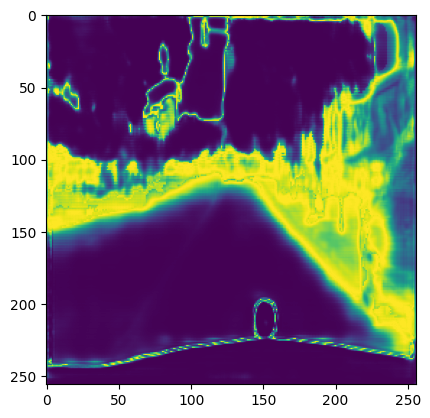

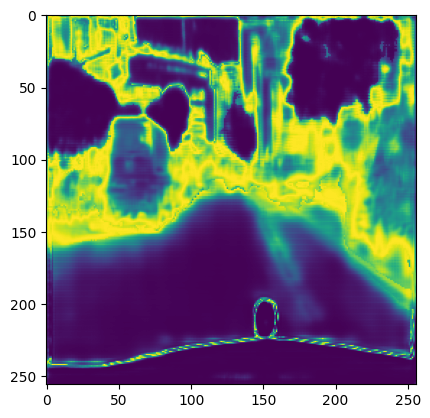

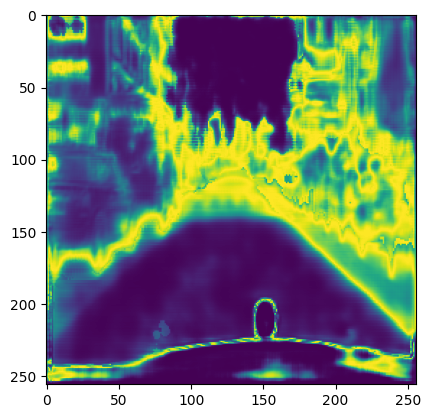

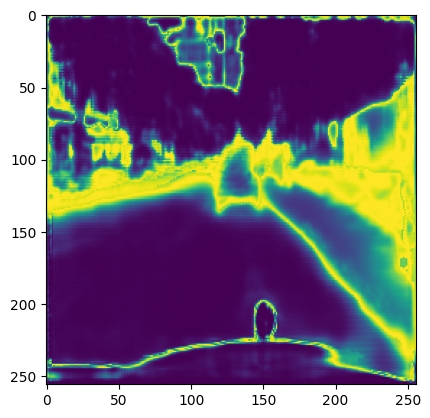

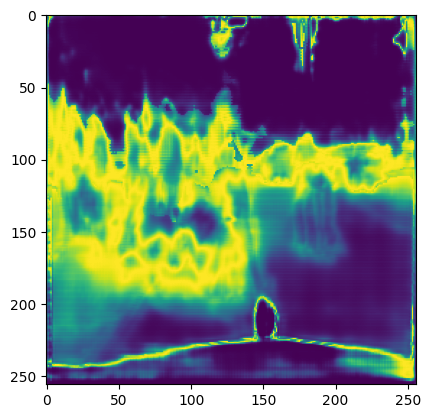

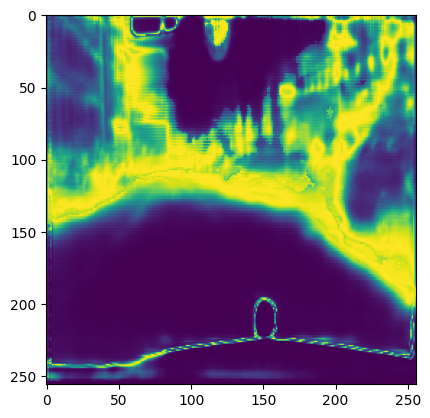

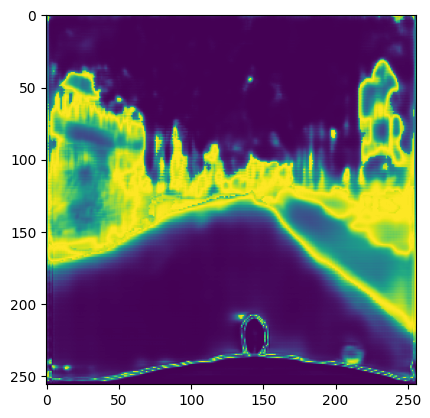

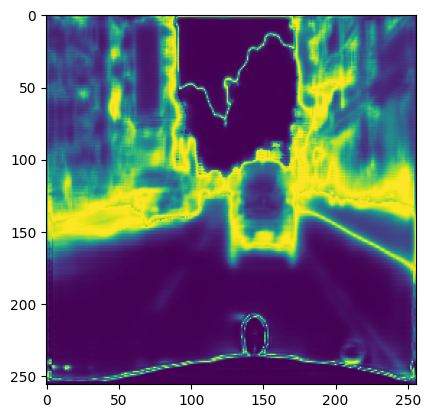

In [ ]:
print(entropy[0].shape)
e = entropy.cpu().detach().numpy()
print(e.shape)
# print(e.shape)
for i in range(8):
    plt.imshow(e[i][0])
    plt.show()
# fig, axes = plt.subplots(test_batch_size, 1, figsize=(1*5, test_batch_size*5))
# for i in range(test_batch_size):
#     axes[i].imshow(e[0])

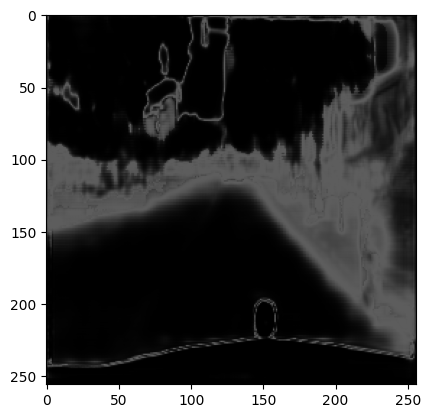

In [ ]:

entropy_grid = torchvision.utils.make_grid(entropy[0])
plt.imshow(entropy_grid.permute(1, 2, 0))
plt.show()

In [ ]:
overlay_heatmap(Y_pred[0].cpu().detach().numpy(),entropy_grid[0])

NameError: name 'overlay_heatmap' is not defined

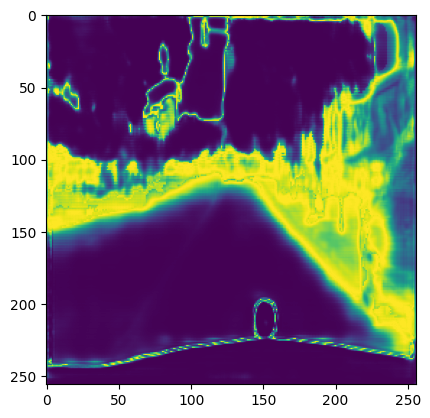

In [ ]:
e_grid = torchvision.utils.make_grid(entropy[0])
plt.imshow(e_grid[0])

In [ ]:
# print(entropy_grid.shape)
type(X[0])

torch.Tensor

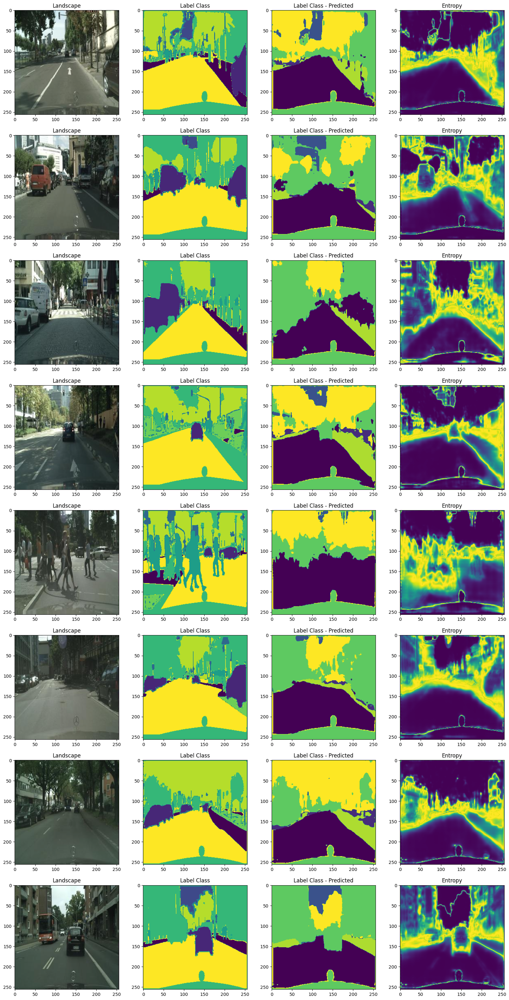

In [ ]:
fig, axes = plt.subplots(test_batch_size, 4, figsize=(4*5, test_batch_size*5))


for i in range(test_batch_size):

    landscape = inverse_transform(X[i]).permute(1, 2, 0).cpu().detach().numpy()
    label_class = Y[i].cpu().detach().numpy()
    label_class_predicted = Y_pred[i].cpu().detach().numpy()

    axes[i, 0].imshow(landscape)
    axes[i, 0].set_title("Landscape")
    axes[i, 1].imshow(label_class)
    axes[i, 1].set_title("Label Class")
    axes[i, 2].imshow(label_class_predicted)
    axes[i, 2].set_title("Label Class - Predicted")
    axes[i,3].imshow(e[i][0])
    axes[i,3].set_title("Entropy")

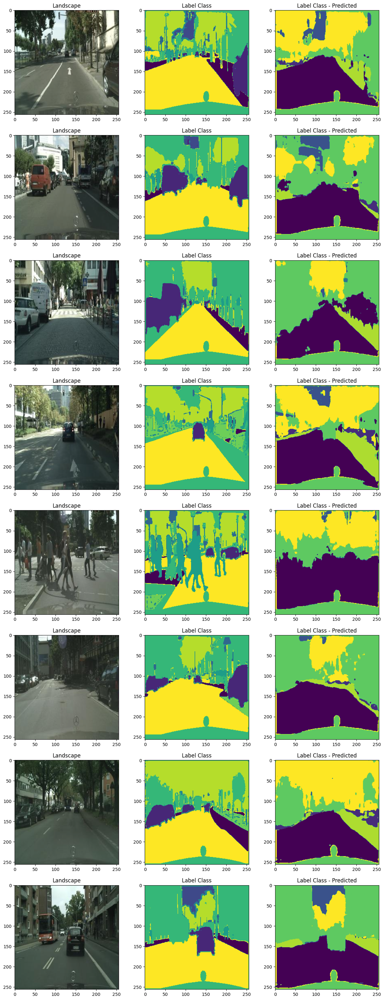

In [ ]:
fig, axes = plt.subplots(test_batch_size, 3, figsize=(3*5, test_batch_size*5))

for i in range(test_batch_size):

    landscape = inverse_transform(X[i]).permute(1, 2, 0).cpu().detach().numpy()
    label_class = Y[i].cpu().detach().numpy()
    label_class_predicted = Y_pred[i].cpu().detach().numpy()

    axes[i, 0].imshow(landscape)
    axes[i, 0].set_title("Landscape")
    axes[i, 1].imshow(label_class)
    axes[i, 1].set_title("Label Class")
    axes[i, 2].imshow(label_class_predicted)
    axes[i, 2].set_title("Label Class - Predicted")

In [ ]:
def entropy(images,net):
    X, Y = next(iter(data_loader))
    X, Y = X.to(device).float(), Y.to(device).long()
    pred = model_(X)
    pred = F.relu(pred)
    pred = pred.detach()
    pred = torch.max(pred[:,:,:],dim=1)
    pred = pred[0]

    entropy = -1 * torch.sum(pred * torch.log(pred+1e-30))
    entropy = entropy.detach().cpu().numpy()
    return entropy
entropy(val_fns,model_)

array(-4434231.5, dtype=float32)

In [ ]:
def entropy(pred):

    pred = pred.detach()
    pred = torch.max(pred[:,:,:],dim=1)
    pred = pred[0]

    entropy = (-1) * torch.sum(pred * torch.log(pred+1e-30))
    entropy = entropy.detach().cpu().numpy()
    return entropy
entropy(Y_pred)

array(-40181.27, dtype=float32)

In [ ]:
label_class_predicted = []
for i in range(test_batch_size):
    label_class_predicted.append(Y_pred[i].cpu().detach().numpy())
most_conf = np.nanmax(label_class_predicted)
num_labels = len(label_class_predicted)
numerator = (num_labels*(1 - most_conf))
denominator = (num_labels-1)

least_conf = numerator/denominator
print(least_conf)

-9.142857142857142


In [ ]:
print(Y_pred.shape)

torch.Size([8, 256, 256])


# Applying ViewAL approach for Viewpoint entropy & superpixel oriented uncertainty

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ViewAL(nn.Module):
    def __init__(self, num_classes, viewpoints):
        super(ViewAL, self).__init__()
        self.num_classes = num_classes
        self.viewpoints = viewpoints

    def forward(self, predictions, views):
        # Compute viewpoint entropy
        prob = F.softmax(predictions, dim=1)
        prob_view = prob.gather(2, views.view(-1, 1, 1, 1).expand(-1, self.num_classes, -1, -1))
        log_prob_view = torch.log(prob_view + 1e-10)
        entropy_view = -(prob_view * log_prob_view).mean(dim=1).mean(dim=1)

        # Compute superpixel-based uncertainty
        _, _, H, W = predictions.size()
        superpixels = self.compute_superpixels(predictions)  # (batch_size, num_superpixels, num_classes)
        prob_superpixel = F.softmax(superpixels, dim=2)
        entropy_superpixel = -(prob_superpixel * torch.log(prob_superpixel + 1e-10)).sum(dim=2)

        # Combine viewpoint entropy and superpixel-based uncertainty
        uncertainty = entropy_view + entropy_superpixel

        return uncertainty

    def compute_superpixels(self, predictions):
        pass
# Compute superpixels from predictions.

# Entropy Score...

In [ ]:
pip install scikit-image

Note: you may need to restart the kernel to use updated packages.


In [ ]:
def entropy(probabilities):
    return -(probabilities * torch.log(probabilities + 1e-10)).sum()

# output
#prob = torch.tensor(Y_pred)
entropy_score = entropy(Y_pred[0])
print(entropy_score)

tensor(-701343.8125)


In [ ]:
from skimage.io import imread, imshow
from skimage import data
from skimage.util import img_as_ubyte
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2hsv, rgb2gray, rgb2yuv

In [ ]:
img = Image.fromarray((Y_pred[0].cpu()).numpy().astype(np.uint8).transpose(1, 2, 0))
transform = transforms.Grayscale()
img = transform(im)

ValueError: axes don't match array

In [ ]:
def select_uncertain_pixels(masked_image, model):
    # Get the predicted probability for each pixel
    predicted_probabilities = model(masked_image)
    # Compute the entropy for each pixel
    pixel_entropies = -np.sum(predicted_probabilities * np.log(predicted_probabilities + 1e-10), axis=-1)
    # Normalize the entropies to be between 0 and 1
    pixel_entropies = (pixel_entropies - np.min(pixel_entropies)) / (np.max(pixel_entropies) - np.min(pixel_entropies))
    # Select the top N uncertain pixels
    N = 1000
    uncertain_pixels = np.argpartition(pixel_entropies.ravel(), -N)[-N:]
    return uncertain_pixels


In [ ]:
import cv2

def overlay_heatmap(segmented_image, uncertain_pixels):
    # Create an empty heatmap image with the same shape as the segmented image
    heatmap = np.zeros_like(segmented_image)
    # Set the value of the uncertain pixels to 255
    heatmap[uncertain_pixels] = 255
    # Convert the heatmap to a color image
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    # Overlay the heatmap on top of the segmented image
    heatmap = cv2.addWeighted(segmented_image, 0.5, heatmap, 0.5, 0)
    return heatmap


In [ ]:


def select_uncertain_pixels(input_tensor, model):
    # Convert the image to a tensor
#     input_tensor = torch.from_numpy(rgb_image).permute(2,0,1).unsqueeze(0).float()
    # Get the predicted probability for each pixel
    predicted_probabilities = model(input_tensor)
    # Compute the entropy for each pixel
    pixel_entropies = -torch.sum(predicted_probabilities * torch.log(predicted_probabilities + 1e-10), dim=-1)
    # Normalize the entropies to be between 0 and 1
    pixel_entropies = (pixel_entropies - torch.min(pixel_entropies)) / (torch.max(pixel_entropies) - torch.min(pixel_entropies))
    # Select the top N uncertain pixels
    N = 1000
    uncertain_pixels = torch.argsort(pixel_entropies.view(-1), descending=True)[:N]
    return uncertain_pixels


In [ ]:
select_uncertain_pixels(X,model_)

tensor([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
         14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
         28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
         42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
         56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
         70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
         84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
         98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
        112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
        126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
        140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153,
        154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
        168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 1

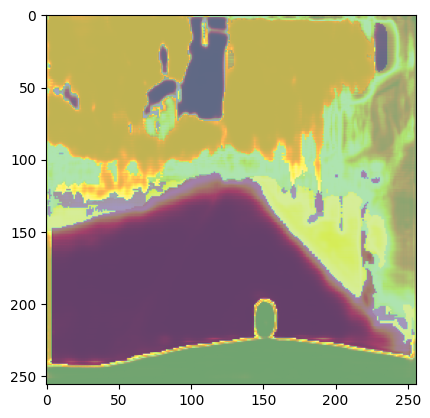

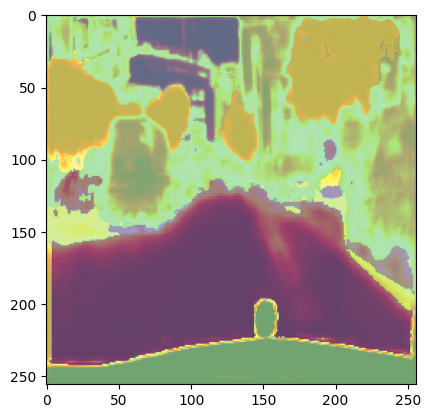

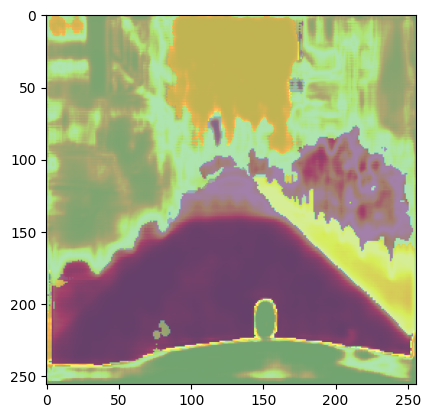

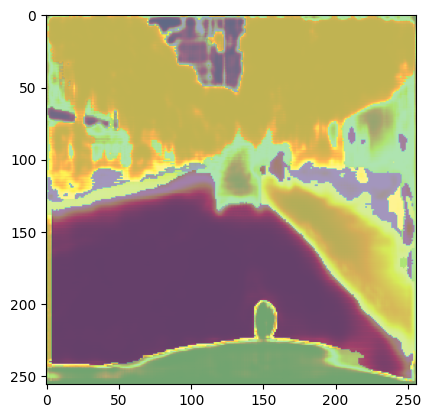

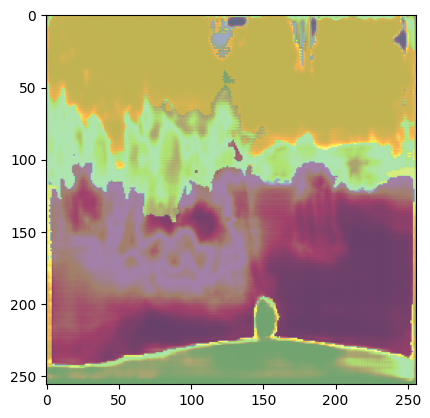

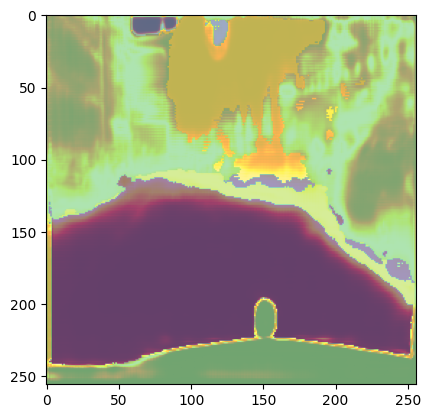

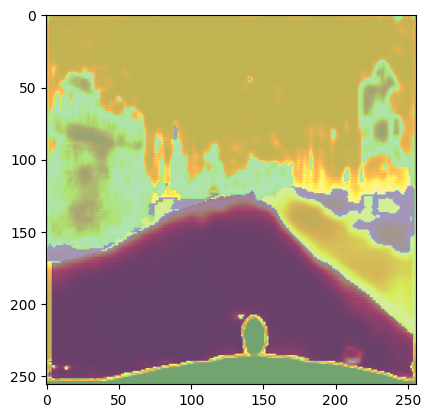

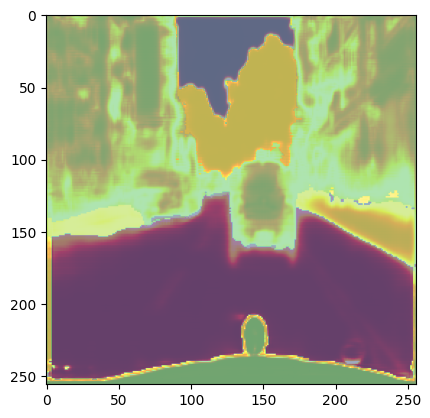

In [ ]:


def overlay_heatmap(segmented_image, entropies, cmap='hot'):
    # Normalize the entropies to be between 0 and 1
    entropies = (entropies - entropies.min()) / (entropies.max() - entropies.min())
    # Convert the entropies to a 2D image
    entropies_image = entropies.reshape(segmented_image.shape[:2])
    # Create a heatmap
    plt.imshow(entropies_image, cmap='hot',alpha=0.5)
    plt.imshow(segmented_image,alpha=0.5)
    plt.show()

# assume we have a segmented image and the entropies of the pixels
# segmented_image = torch.rand(3, 256, 256)
# entropies = torch.rand(256*256)
for i in range(test_batch_size):

    overlay_heatmap(Y_pred[i].cpu().detach().numpy(),e[i][0])


In [ ]:
print(Y_pred.shape)

torch.Size([8, 256, 256])


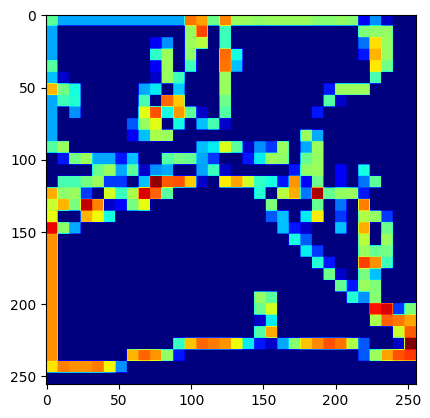

In [ ]:
from scipy.stats import entropy

def patchwise_entropy(image, patch_size=8):
    h, w = image.shape
    entropy_vals = []
    for i in range(0, h - patch_size + 1, patch_size):
        for j in range(0, w - patch_size + 1, patch_size):
            patch = image[i:i + patch_size, j:j + patch_size]
            hist = torch.histc(patch.float(), bins=256, min=0, max=255)
            hist = hist / torch.sum(hist)
            patch_entropy = entropy(hist.numpy(), base=2)
            entropy_vals.append(patch_entropy)
    return entropy_vals

# Load an example segmented image
# image = torch.from_numpy(cv2.imread('segmented_image.png', cv2.IMREAD_GRAYSCALE)).float()
image = Y_pred[0].cpu()

# Calculate patchwise entropy
entropy_vals = patchwise_entropy(image)

# Create a heatmap of the entropy values
entropy_map = torch.zeros(image.shape).numpy()
k = 0
for i in range(0, image.shape[0] - 8 + 1, 8):
    for j in range(0, image.shape[1] - 8 + 1, 8):
        entropy_map[i:i + 8, j:j + 8] = entropy_vals[k]
        k += 1

# Display the entropy map
plt.imshow(entropy_map, cmap='jet')
plt.show()


In [ ]:

from scipy.stats import entropy

def patchwise_entropy(segmented_image, patch_size=(16,16)):
    """
    Calculates patchwise entropy of a semantically segmented image

    Parameters:
    segmented_image (np.ndarray): The input semantically segmented image
    patch_size (tuple): The size of the patches

    Returns:
    np.ndarray: The patchwise entropy map
    """
    # Get the number of classes
    classes = np.unique(segmented_image)
    num_classes = len(classes)

    # Divide the image into patches
    patches = divide_into_patches(segmented_image, patch_size)

    # Calculate the entropy of each patch
    entropy_map = np.zeros(segmented_image.shape)
    for patch in patches:
        patch_prob = np.zeros(num_classes)
        for c in range(num_classes):
            patch_prob[c] = np.sum(patch == classes[c]) / patch.size
        patch_entropy = entropy(patch_prob, base=2)
        entropy_map[patch.nonzero()] = patch_entropy

    return entropy_map

def divide_into_patches(image, patch_size):
    """
    Divides an image into overlapping or non-overlapping patches

    Parameters:
    image (np.ndarray): The input image
    patch_size (tuple): The size of the patches

    Returns:
    list: A list of patches
    """
    patches = []
    for i in range(0, image.shape[0], patch_size[0]):
        for j in range(0, image.shape[1], patch_size[1]):
            patch = image[i:i+patch_size[0], j:j+patch_size[1]]
            patches.append(patch)
    return patches


In [ ]:
import torch
import numpy as np
from scipy.stats import entropy

def patchwise_entropy(segmented_image, patch_size):
    """
    Function to calculate patchwise entropy of a semantically segmented image.

    Parameters:
    - segmented_image (torch.Tensor): A tensor of shape (C, H, W) representing the semantically segmented image.
    - patch_size (int): Size of the patch to calculate entropy for.

    Returns:
    - entropy_map (np.ndarray): A 2D numpy array representing the entropy map of the segmented image.
    """
    C, H, W = segmented_image.shape
    entropy_map = np.zeros((H, W))

    # Calculating the histograms for each patch
    for i in range(0, H - patch_size + 1, patch_size):
        for j in range(0, W - patch_size + 1, patch_size):
            patch = segmented_image[:, i:i + patch_size, j:j + patch_size].flatten()
            histogram, _ = np.histogram(patch, bins=C, range=(0, C), density=True)
            entropy_map[i:i + patch_size, j:j + patch_size] = entropy(histogram, base=2)

    return entropy_map


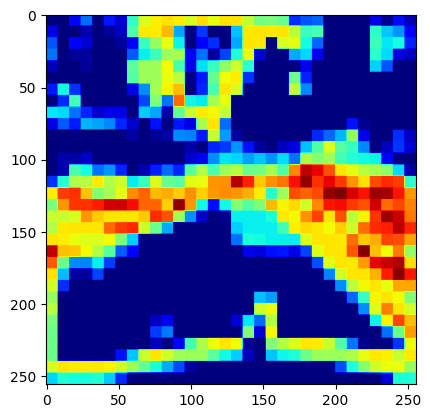

In [ ]:
segmented_image = Y_pred.cpu()
entropy_map = patchwise_entropy(segmented_image, 8)

plt.imshow(entropy_map, cmap='jet')
plt.show()


Coordinates of patches with the highest entropy:
(120, 200)
(120, 201)
(120, 202)
(120, 203)
(120, 204)
(120, 205)
(120, 206)
(120, 207)
(121, 200)
(121, 201)
(121, 202)
(121, 203)
(121, 204)
(121, 205)
(121, 206)
(121, 207)
(122, 200)
(122, 201)
(122, 202)
(122, 203)
(122, 204)
(122, 205)
(122, 206)
(122, 207)
(123, 200)
(123, 201)
(123, 202)
(123, 203)
(123, 204)
(123, 205)
(123, 206)
(123, 207)
(124, 200)
(124, 201)
(124, 202)
(124, 203)
(124, 204)
(124, 205)
(124, 206)
(124, 207)
(125, 200)
(125, 201)
(125, 202)
(125, 203)
(125, 204)
(125, 205)
(125, 206)
(125, 207)
(126, 200)
(126, 201)
(126, 202)
(126, 203)
(126, 204)
(126, 205)
(126, 206)
(126, 207)
(127, 200)
(127, 201)
(127, 202)
(127, 203)
(127, 204)
(127, 205)
(127, 206)
(127, 207)


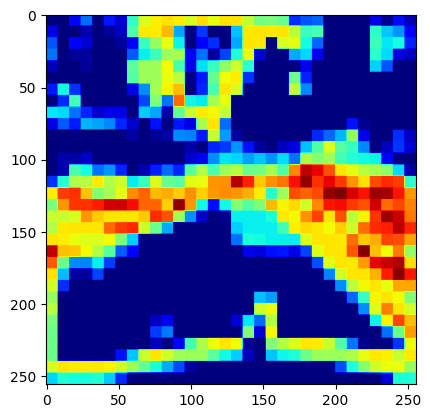

In [ ]:
import matplotlib.pyplot as plt

# Find the maximum entropy value
max_entropy = np.max(entropy_map)

# Get the coordinates of patches with the highest entropy
max_entropy_coords = np.argwhere(entropy_map == max_entropy)

print("Coordinates of patches with the highest entropy:")
for coord in max_entropy_coords:
    print(f"({coord[0]}, {coord[1]})")

# Plot the entropy map
plt.imshow(entropy_map, cmap='jet')
plt.show()


Coordinates of wrongly segmented patches:
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)
(0, 0)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



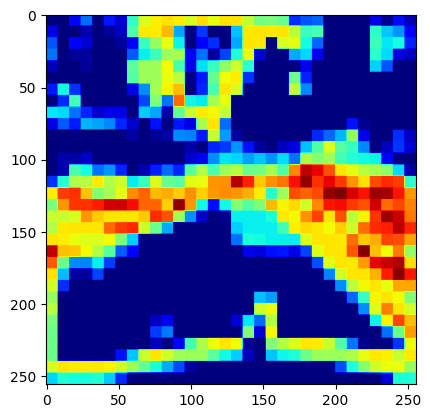

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Convert the segmented_image tensor to a NumPy array
segmented_image_np = segmented_image.numpy()

# Compare the ground truth with the segmented image
diff = np.abs(label_class - segmented_image_np)

# Set a threshold for considering a patch as wrongly segmented
threshold = 0.5

# Find the wrongly segmented patches
wrongly_segmented = diff > threshold

# Get the coordinates of wrongly segmented patches
wrongly_segmented_coords = np.argwhere(wrongly_segmented)

print("Coordinates of wrongly segmented patches:")
for coord in wrongly_segmented_coords:
    print(f"({coord[0]}, {coord[1]})")

# Plot the entropy map
plt.imshow(entropy_map, cmap='jet')
plt.show()


In [ ]:
print(segmented_image.shape)

torch.Size([8, 256, 256])


In [ ]:
print(Y_pred.shape)

torch.Size([8, 256, 256])


In [ ]:
print(entropy_map.shape)

(256, 256)


# Making Local Dataset

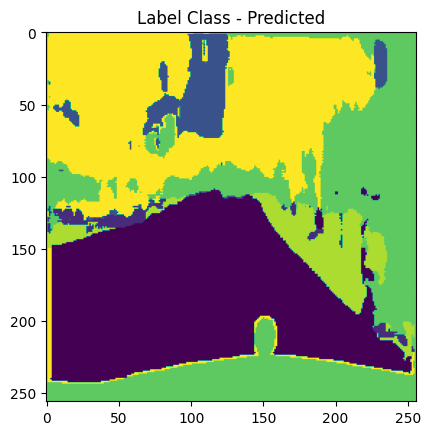

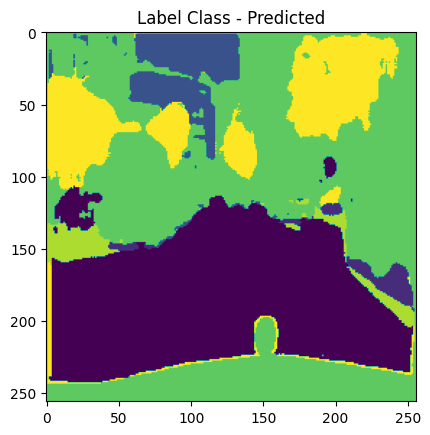

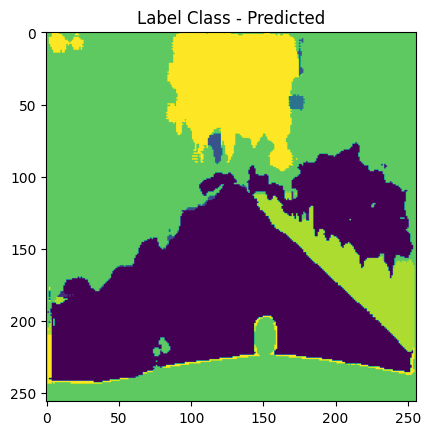

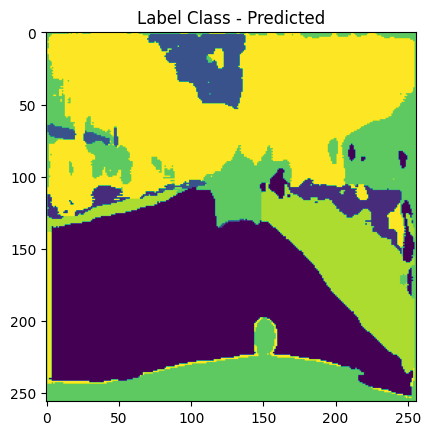

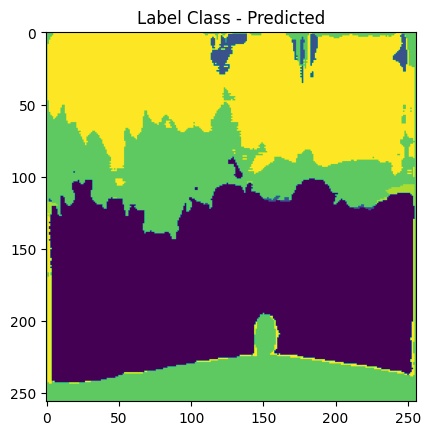

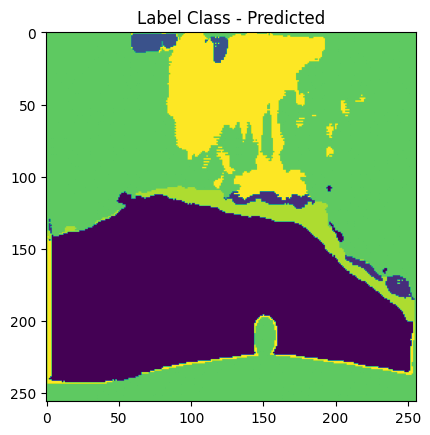

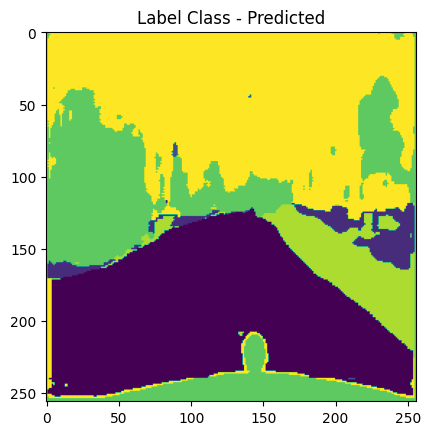

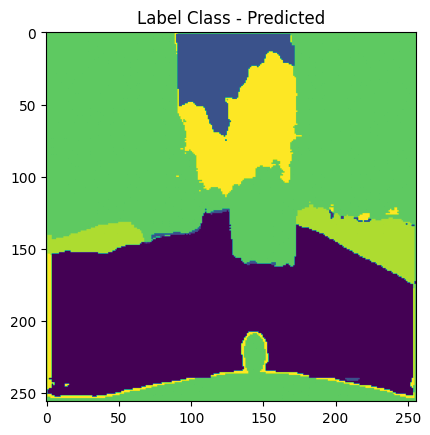

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the directory where you want to save the images
output_directory = "/Users/muditbaid/Downloads/U-Net Output"
os.makedirs(output_directory, exist_ok=True)

for i in range(test_batch_size):
    label_class_predicted = Y_pred[i].cpu().detach().numpy()

    # Save the "Label Class - Predicted" image
    image_filename = os.path.join(output_directory, f"image_{i}.png")
    cv2.imwrite(image_filename, label_class_predicted * 255)  # Convert to 0-255 scale

    # Optional: Display the saved image
    plt.imshow(label_class_predicted)
    plt.title("Label Class - Predicted")
    plt.show()


In [ ]:
import os
import matplotlib.pyplot as plt

# Define your variables
test_batch_size = 7
# Define other variables like X, Y_pred, etc.

# Create an output directory
output_dir = "/Users/muditbaid/Downloads/U-Net Output"
os.makedirs(output_dir, exist_ok=True)

# Loop through predicted images, save as PNG files
for i in range(test_batch_size):
    label_class_predicted = Y_pred[i].cpu().detach().numpy()
    image_path = os.path.join(output_dir, f"predicted_image_{i}.png")
    plt.imsave(image_path, label_class_predicted)


In [ ]:
import os
import matplotlib.pyplot as plt
import shutil

# Define your variables
test_batch_size = 7


# Create an output directory
output_dir = "/Users/muditbaid/Downloads/U-Net Output"
os.makedirs(output_dir, exist_ok=True)

# Loop through predicted images, save original images, and create a zip archive
for i in range(test_batch_size):
    landscape = inverse_transform(X[i]).permute(1, 2, 0).cpu().detach().numpy()
    image_path = os.path.join(output_dir, f"original_image_predicted_{i}.png")
    plt.imsave(image_path, landscape)

# Create a zip archive of the output directory
shutil.make_archive(output_dir, 'zip', output_dir)


'/Users/srirammandalika/Downloads/U-Net Output.zip'

# Annotation Section

In [ ]:
pip install pandas Pillow


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
from PIL import Image

# Define the directories containing RGB and segmented images
rgb_dir = '/Users/muditbaid/Downloads/NewAnno'
segmented_dir = '/Users/muditbaid/Downloads/U-NetOutput'

# Get the list of file names in both directories
rgb_files = os.listdir(rgb_dir)
segmented_files = os.listdir(segmented_dir)

# Sort the file names to ensure they are in the same order
rgb_files.sort()
segmented_files.sort()

# Iterate through the paired images
for rgb_file, segmented_file in zip(rgb_files, segmented_files):
    # Create the full file paths
    rgb_path = os.path.join(rgb_dir, rgb_file)
    segmented_path = os.path.join(segmented_dir, segmented_file)

    # Open the images using PIL
    rgb_image = Image.open(rgb_path)
    segmented_image = Image.open(segmented_path)

    # Perform operations on the paired images (e.g., display, save, process)

    # Example: Display the paired images
    rgb_image.show()
    segmented_image.show()


UnidentifiedImageError: cannot identify image file '/Users/srirammandalika/Downloads/NewAnno/.DS_Store'

In [ ]:
import os
from PIL import Image

# Define the directories containing RGB and segmented images
rgb_dir = '/Users/muditbaid/Downloads/U-NetOutput'
segmented_dir = '/Users/muditbaid/Downloads/NewAnno'

# Get the list of file names in both directories
rgb_files = os.listdir(rgb_dir)
segmented_files = os.listdir(segmented_dir)

# Sort the file names to ensure they are in the same order
rgb_files.sort()
segmented_files.sort()

# Iterate through the paired images
for rgb_file, segmented_file in zip(rgb_files, segmented_files):
    # Skip non-image files (e.g., .DS_Store)
    if not rgb_file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
        continue

    # Create the full file paths
    rgb_path = os.path.join(rgb_dir, rgb_file)
    segmented_path = os.path.join(segmented_dir, segmented_file)

    # Open the images using PIL
    try:
        rgb_image = Image.open(rgb_path)
        segmented_image = Image.open(segmented_path)

        # Perform operations on the paired images (e.g., display, save, process)

        # Example: Display the paired images
        rgb_image.show()
        segmented_image.show()
    except Exception as e:
        print(f"Error processing {rgb_file} and {segmented_file}: {str(e)}")


In [ ]:
import os
from PIL import Image

# Define the file paths for the RGB and segmented images
rgb_file_path = '/Users/muditbaid/Downloads/U-NetOutput/U8.png'
segmented_file_path = '/Users/muditbaid/Downloads/NewAnno/Seg8.png'

# Create an output directory to save the combined images
output_dir = '/Users/muditbaid/Downloads/CombinedImages'
os.makedirs(output_dir, exist_ok=True)

# Desired dimensions
desired_width = 512
desired_height = 256

# Open the RGB image using PIL and resize it
try:
    rgb_image = Image.open(rgb_file_path)
    rgb_image_resized = rgb_image.resize((desired_width, desired_height))

    # Open the segmented image using PIL and resize it to match the desired dimensions
    segmented_image = Image.open(segmented_file_path)
    segmented_image_resized = segmented_image.resize((desired_width, desired_height))

    # Create a new image with the desired dimensions to combine the RGB and segmented images
    combined_image = Image.new('RGB', (desired_width * 2, desired_height))
    combined_image.paste(rgb_image_resized, (0, 0))
    combined_image.paste(segmented_image_resized, (desired_width, 0))

    # Save the combined image to the output directory
    combined_image.save(os.path.join(output_dir, f"combined_{os.path.basename(segmented_file_path)}"))

except Exception as e:
    print(f"Error processing {rgb_file_path} and segmented image: {str(e)}")



# Re-Loop

In [ ]:
import torch

# Define the device (CPU or GPU) based on your system configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Initialize your UNet model
model = UNet(num_classes=num_classes).to(device)

# Load the pretrained weights
model.load_state_dict(torch.load("/Users/muditbaid/Desktop/U-Net.pth", map_location=device))
model.eval()  # Set the model to evaluation mode


UNet(
  (contracting_11): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contracting_12): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (contracting_21): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contracting_22): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (contr

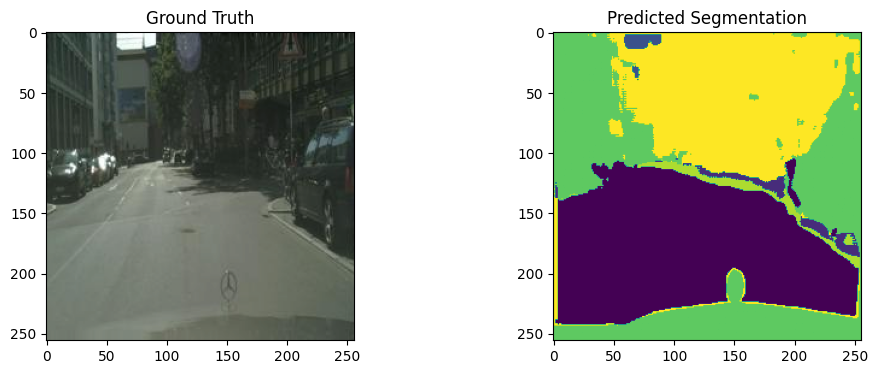

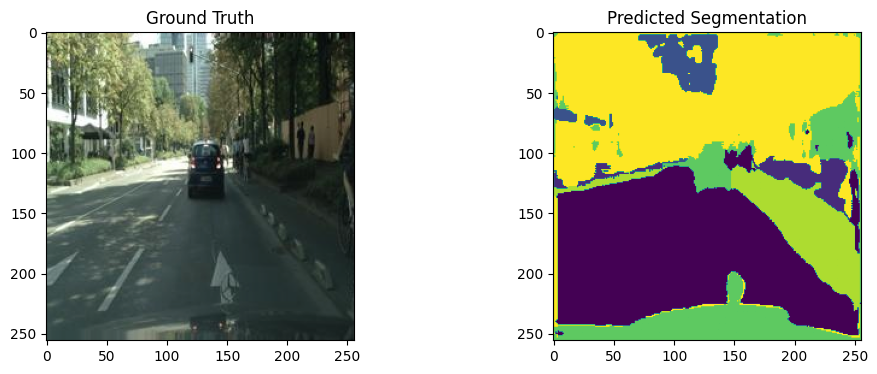

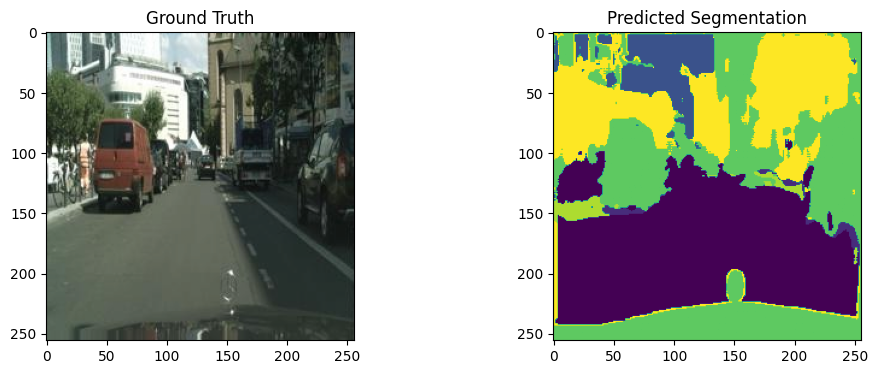

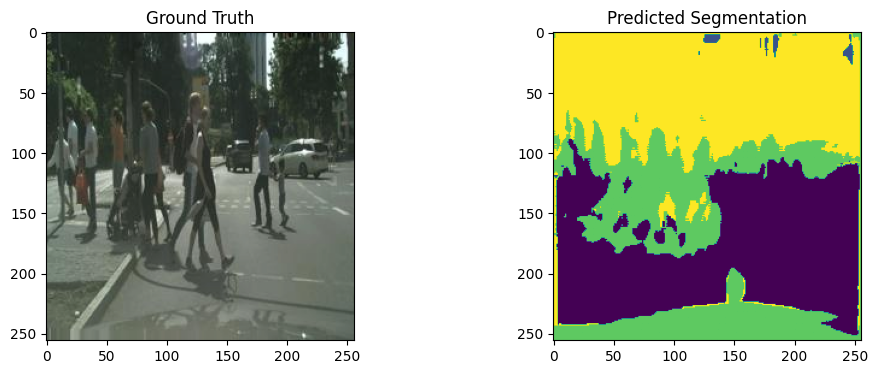

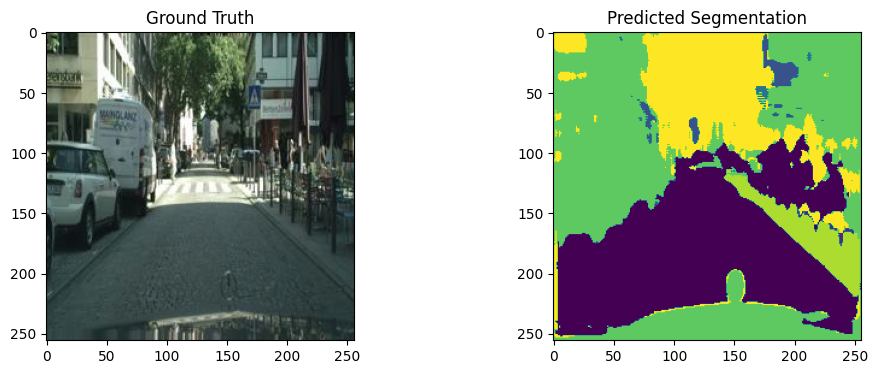

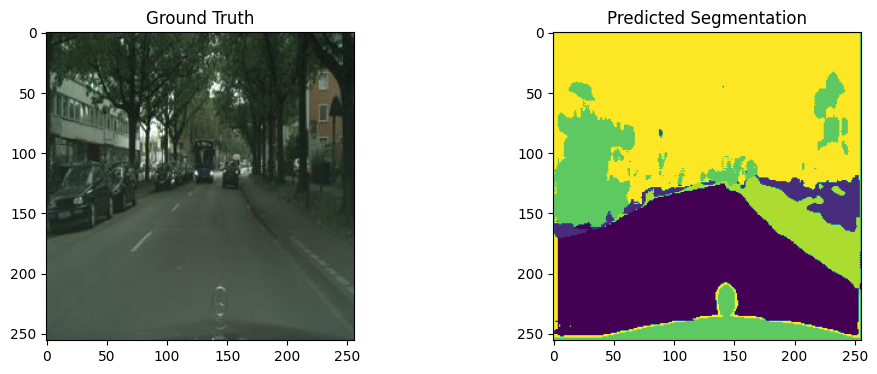

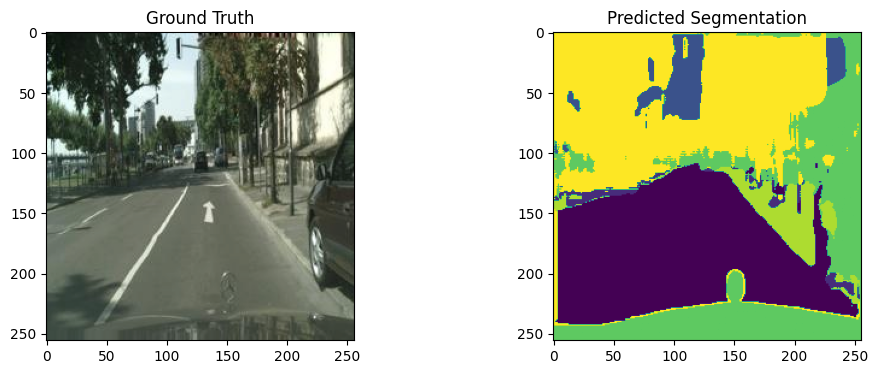

In [ ]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt

# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.image_files = [f for f in os.listdir(os.path.join(data_dir, 'images')) if f.endswith('.png')]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_dir, 'images', self.image_files[idx])
        label_name = os.path.join(self.data_dir, 'labels', self.image_files[idx].replace('.png', '_label.png'))
        image = Image.open(img_name)
        label = Image.open(label_name)  # Load the corresponding label image

        if self.transform:
            image = self.transform(image)
            label = self.transform(label)  # Apply the same transform to the label

        return image, label

# Define data transformations for RGB images
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x[:3, :, :]),  # Keep only the first 3 channels (R, G, B)
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])

# Specify the path to your custom dataset directory
custom_data_dir = '/Users/muditbaid/Downloads/LocalCityscapesDataset'  # Update with your dataset directory

# Create a custom dataset instance
custom_dataset = CustomDataset(custom_data_dir, transform=transform)

# Create a data loader for batch processing
data_loader = DataLoader(custom_dataset, batch_size=4, shuffle=True)

# Load your pretrained U-Net model
model_path = "/Users/muditbaid/Desktop/U-Net.pth"
device = torch.device("cpu")

# Instantiate your U-Net model and load the pretrained weights
model = UNet(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))


# Set the model to evaluation mode
model.eval()

# Reverse the normalization for visualization
mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])

for images, labels in data_loader:
    images = images.to(device)
    labels = labels.to(device)

    # Forward pass through the model
    with torch.no_grad():
        outputs = model(images)

    # Post-process the model outputs (e.g., apply softmax and convert to class labels)
    predicted_labels = torch.argmax(outputs, dim=1).cpu().numpy()

    # Plot the original images and predicted segmentations
    num_samples = images.size(0)
    for i in range(num_samples):
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.title("Ground Truth")

        # Reverse normalization and convert to numpy
        image_np = images[i].cpu().numpy().transpose(1, 2, 0)
        image_np = (image_np * std.numpy()) + mean.numpy()
        plt.imshow(image_np.clip(0, 1))  # Ensure pixel values are in [0, 1] range

        plt.subplot(1, 2, 2)
        plt.title("Predicted Segmentation")
        plt.imshow(predicted_labels[i], cmap='viridis')
        plt.show()


# IMoU

In [ ]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np

# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.image_files = [f for f in os.listdir(os.path.join(data_dir, 'images')) if f.endswith('.png')]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_dir, 'images', self.image_files[idx])
        label_name = os.path.join(self.data_dir, 'labels', self.image_files[idx].replace('.png', '_label.png'))
        image = Image.open(img_name)
        label = Image.open(label_name)  # Load the corresponding label image

        if self.transform:
            image = self.transform(image)
            label = self.transform(label)  # Apply the same transform to the label

        return image, label

# Define data transformations for RGB images
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x[:3, :, :]),  # Keep only the first 3 channels (R, G, B)
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])

# Specify the path to your custom dataset directory
custom_data_dir = '/Users/muditbaid/Downloads/LocalCityscapesDataset'  # Update with your dataset directory

# Create a custom dataset instance
custom_dataset = CustomDataset(custom_data_dir, transform=transform)

# Create a data loader for batch processing
data_loader = DataLoader(custom_dataset, batch_size=4, shuffle=True)

# Load your pretrained U-Net model
model_path = "/Users/muditbaid/Desktop/U-Net.pth"
device = torch.device("cpu")

# Instantiate your U-Net model and load the pretrained weights
model = UNet(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))

# Set the model to evaluation mode
model.eval()

# Function to calculate Intersection over Union (IoU)
def calculate_iou(predicted, target):
    intersection = np.logical_and(predicted, target)
    union = np.logical_or(predicted, target)
    iou = np.sum(intersection) / np.sum(union)
    return iou

# Initialize a list to store the MIoU values
miou_values = []

# Reverse the normalization for visualization
mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])

for images, labels in data_loader:
    images = images.to(device)
    labels = labels.to(device)

    # Forward pass through the model
    with torch.no_grad():
        outputs = model(images)

    # Post-process the model outputs (e.g., apply softmax and convert to class labels)
    predicted_labels = torch.argmax(outputs, dim=1).cpu().numpy()

    # Calculate IoU for each pair of predicted and ground truth labels
    for i in range(images.size(0)):
        iou = calculate_iou(predicted_labels[i], labels[i].cpu().numpy())
        miou_values.append(iou)

# Calculate MIoU by taking the mean of all IoU values
miou = np.mean(miou_values)
print(f"Mean Intersection over Union (MIoU): {miou:.4f}")


Mean Intersection over Union (MIoU): 1.0000


# Dice Coefficient

In [ ]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np

# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.image_files = [f for f in os.listdir(os.path.join(data_dir, 'images')) if f.endswith('.png')]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_dir, 'images', self.image_files[idx])
        label_name = os.path.join(self.data_dir, 'labels', self.image_files[idx].replace('.png', '_label.png'))
        image = Image.open(img_name)
        label = Image.open(label_name)  # Load the corresponding label image

        if self.transform:
            image = self.transform(image)
            label = self.transform(label)  # Apply the same transform to the label

        return image, label

# Define data transformations for RGB images
# Define data transformations for RGB images
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x[:3, :, :]),  # Keep only the first 3 channels (R, G, B)
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])


# Specify the path to your custom dataset directory
custom_data_dir = '/Users/muditbaid/Downloads/LocalCityscapesDataset'  # Update with your dataset directory

# Create a custom dataset instance
custom_dataset = CustomDataset(custom_data_dir, transform=transform)

# Create a data loader for batch processing
data_loader = DataLoader(custom_dataset, batch_size=4, shuffle=True)

# Load your pretrained U-Net model
model_path = "/Users/muditbaid/Desktop/U-Net.pth"
device = torch.device("cpu")

# Instantiate your U-Net model and load the pretrained weights
model = UNet(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))

# Set the model to evaluation mode
model.eval()

# Define a function to calculate Dice Coefficient
def dice_coefficient(predicted, target):
    intersection = (predicted * target).sum()
    dice = (2.0 * intersection) / (predicted.sum() + target.sum())
    return dice

dice_scores = []

for images, labels in data_loader:
    images = images.to(device)
    labels = labels.to(device)

    # Forward pass through the model
    with torch.no_grad():
        outputs = model(images)

    # Convert outputs and labels to binary masks
    _, predicted_masks = torch.max(outputs, dim=1)  # Use torch.max to get the class indices
    target_masks = labels.squeeze(1)  # Assuming labels are single-channel

    # Dice Coefficient for each image in the batch
    for i in range(images.size(0)):
        dice = dice_coefficient(predicted_masks[i], target_masks[i])
        dice_scores.append(dice.item())

# Print the Dice Coefficient
for i, score in enumerate(dice_scores):
    print(f"Dice Coefficient for Image {i + 1}: {score:.4f}")



Dice Coefficient for Image 1: -5.5054
Dice Coefficient for Image 2: -8.6910
Dice Coefficient for Image 3: -6.4315
Dice Coefficient for Image 4: -4.8446
Dice Coefficient for Image 5: -5.6611
Dice Coefficient for Image 6: -9.0042
Dice Coefficient for Image 7: -5.0758


#